#1
📌📌📌NOTE!!! SKIP THIS...START the Code / Proceed to cell #1 instead.❗❗❗

In [ ]:
#2
# Optimize datasets for performance
AUTOTUNE = tf.data.AUTOTUNE
train_dataset = train_dataset.cache().shuffle(1000).prefetch(AUTOTUNE)
validation_dataset = validation_dataset.cache().prefetch(AUTOTUNE)

In [ ]:
#3
# Configure GPU memory growth
physical_devices = tf.config.list_physical_devices('GPU')
if physical_devices:
    for device in physical_devices:
        tf.config.experimental.set_memory_growth(device, True)
    print(f"GPU detected: {len(physical_devices)} device(s)")
else:
    print("No GPU detected, using CPU")


# Add logging of device placement for debugging
tf.debugging.set_log_device_placement(True)  # Optional, can help debug device placement issues

# Set visible devices if you have multiple GPUs and want to use specific ones
# tf.config.set_visible_devices(physical_devices[0:1], 'GPU')  # Uncomment to use only first GPU

In [ ]:
#4 START Here...
#But better install all these libraries in anaconda navigator, the process below can cause error sometimes.
#If not working, use your env prompt before...
#Remove #comment# to install libraries

#!pip install numpy
#!pip install pandas
#!pip install matplotlib
#!pip install --upgrade pip
#!pip install tensorflow
#!pip install --upgrade tensorflow
#pip uninstall tensorflow-gpu #make sure you did not install this?
#!pip install scikit-learn
#!pip install keras-preprocessing
#!pip install opencv-python
#!pip install torch
#!pip install tensorboard

#!pip install --upgrade pip
#or !pip install numpy pandas matplotlib tensorflow scikit-learn keras-preprocessing opencv-python torch tensorboard
#!pip install keras-tuner

In [ ]:
#5
# Add a cell to check installed packages and versions
import pkg_resources
import pandas as pd

# Get list of required packages
required = {'numpy', 'pandas', 'matplotlib', 'tensorflow',
            'scikit-learn', 'keras-preprocessing', 'opencv-python',
            'tensorboard', 'keras-tuner'}

# Get all installed packages
installed = {pkg.key for pkg in pkg_resources.working_set}

# Check if all required packages are installed
missing = required - installed

if missing:
    print(f"Missing packages: {missing}")
else:
    # Get versions of installed packages
    versions = {pkg: pkg_resources.get_distribution(pkg).version for pkg in required if pkg in installed}
    pd.DataFrame(versions.items(), columns=['Package', 'Version'])

In [ ]:
#6 Continue Here...
# Import Data Science Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split

# Tensorflow Libraries
from tensorflow import keras
from tensorflow.keras import layers,models
#from keras.preprocessing.image import ImageDataGenerator ###orig
from tensorflow.keras.preprocessing.image import ImageDataGenerator ###edited
#from tensorflow.keras.layers import *
#from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom
# from keras.layers import Dense, Dropout
from tensorflow.keras.layers import Dense, Dropout, RandomFlip, RandomRotation, RandomZoom, Resizing
from tensorflow.keras.callbacks import Callback, EarlyStopping,ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import Model
from tensorflow.keras.layers import Resizing ###edited
#from tensorflow.keras.layers.experimental import preprocessing ###orig
#from tensorflow.python.keras.layers.experimental.preprocessing import *
#from tensorflow.keras.layers import preprocessing


# System libraries
from pathlib import Path
import os.path
import random
from collections import Counter

# Visualization Libraries
import matplotlib.cm as cm
import cv2
import seaborn as sns
from cycler import cycler
import textwrap

sns.set_style('darkgrid')

# Metrics
from sklearn.metrics import classification_report, confusion_matrix
import itertools

# Print TensorFlow version for reference
print(f"TensorFlow version: {tf.__version__}")

📌📌📌SKIP THIS!!!...Proceed to cell #3
Checking the versions of TensorFlow and NumPy to identify compatibility issues
import tensorflow as tf
import numpy as np

print('TensorFlow version:', tf.__version__)
print('NumPy version:', np.__version__)

📌
Checking the versions of TensorFlow and NumPy to identify compatibility issues
import pkg_resources

installed_packages = {pkg.key: pkg.version for pkg in pkg_resources.working_set}

Extracting the versions of TensorFlow and NumPy
tensorflow_version = installed_packages.get('tensorflow', 'Not installed')
numpy_version = installed_packages.get('numpy', 'Not installed')

tensorflow_version, numpy_version

📌
Updating NumPy to a version compatible with TensorFlow 2.13.0
%pip install numpy==1.21.0

print('NumPy updated successfully.')

📌
Reinstalling TensorFlow to ensure all dependencies are correctly set up
%pip install --upgrade --force-reinstall tensorflow

print('TensorFlow reinstalled successfully.')

📌
Attempting to import TensorFlow and NumPy again to verify the installation
try:
    import tensorflow as tf
    import numpy as np
    result = (tf.__version__, np.__version__)
except Exception as e:
    result = str(e)

result

Helper functions downloaded successfully!
Helper functions imported successfully!

Exploring dataset structure at: C:\Users\effie\Documents\JupyterNotebook\archive3\Rice_Image_Dataset

There are 2 directories and 0 images in 'C:\Users\effie\Documents\JupyterNotebook\archive3\Rice_Image_Dataset'.
There are 5 directories and 0 images in 'C:\Users\effie\Documents\JupyterNotebook\archive3\Rice_Image_Dataset\Test'.
There are 0 directories and 188 images in 'C:\Users\effie\Documents\JupyterNotebook\archive3\Rice_Image_Dataset\Test\Bacterial leaf blight'.
There are 0 directories and 163 images in 'C:\Users\effie\Documents\JupyterNotebook\archive3\Rice_Image_Dataset\Test\Blast'.
There are 0 directories and 187 images in 'C:\Users\effie\Documents\JupyterNotebook\archive3\Rice_Image_Dataset\Test\Brown spot'.
There are 0 directories and 149 images in 'C:\Users\effie\Documents\JupyterNotebook\archive3\Rice_Image_Dataset\Test\Sheath blight'.
There are 0 directories and 163 images in 'C:\Users\effie

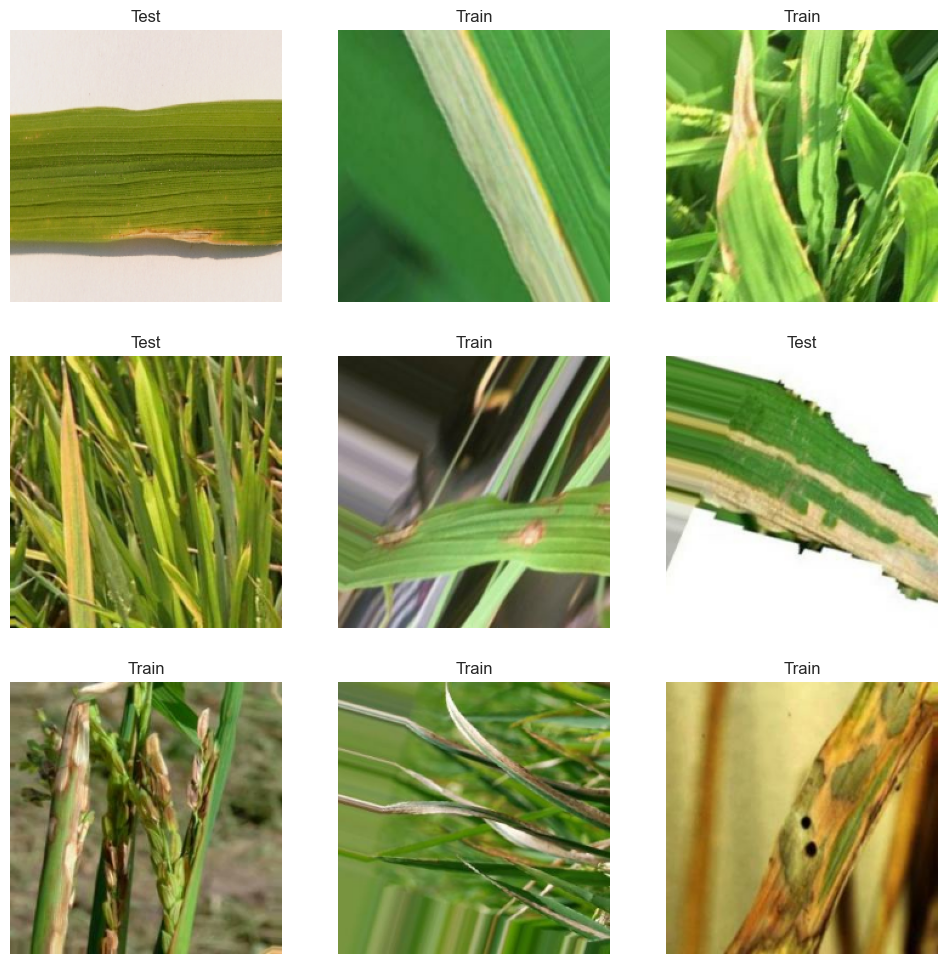

In [ ]:
#7 Continue Here...
# Create helper functions

# !wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py

# # Import series of helper functions for our notebook
# from helper_functions import create_tensorboard_callback, plot_loss_curves, unzip_data, compare_historys, walk_through_dir, pred_and_plot


# BATCH_SIZE = 32
# TARGET_SIZE = (224, 224)
# # Walk through each directory
# dataset = r"C:\Users\effie\Documents\JupyterNotebook\archive3\Rice_Image_Dataset"
# walk_through_dir(dataset);

import os
import sys
from pathlib import Path
import matplotlib.pyplot as plt
import tensorflow as tf

# Configuration settings
CONFIG = {
    "BATCH_SIZE": 32,
    "TARGET_SIZE": (224, 224),
    "DATASET_PATH": Path(r"C:\Users\effie\Documents\JupyterNotebook\archive3\Rice_Image_Dataset"),
    "RANDOM_SEED": 42,
    "VALIDATION_SPLIT": 0.2,
}

# Download helper functions with error handling
try:
    !pip install requests
    import requests

    helper_url = "https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py"
    response = requests.get(helper_url)

    if response.status_code == 200:
        with open("helper_functions.py", "wb") as f:
            f.write(response.content)
        print("Helper functions downloaded successfully!")
    else:
        print(f"Failed to download helper functions. Status code: {response.status_code}")
except Exception as e:
    print(f"Error downloading helper functions: {e}")

# Import helper functions
try:
    from helper_functions import create_tensorboard_callback, plot_loss_curves, unzip_data, compare_historys, walk_through_dir, pred_and_plot
    print("Helper functions imported successfully!")
except ImportError as e:
    print(f"Error importing helper functions: {e}")
    sys.exit(1)

# Verify dataset path exists
if not CONFIG["DATASET_PATH"].exists():
    print(f"Dataset path not found: {CONFIG['DATASET_PATH']}")
    sys.exit(1)

# Explore dataset directory structure
print(f"\nExploring dataset structure at: {CONFIG['DATASET_PATH']}\n")
walk_through_dir(CONFIG["DATASET_PATH"])

# Load and prepare the dataset
print("\nLoading dataset...")
try:
    train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
        CONFIG["DATASET_PATH"],
        validation_split=CONFIG["VALIDATION_SPLIT"],
        subset="training",
        seed=CONFIG["RANDOM_SEED"],
        batch_size=CONFIG["BATCH_SIZE"],
        image_size=CONFIG["TARGET_SIZE"]
    )

    validation_dataset = tf.keras.preprocessing.image_dataset_from_directory(
        CONFIG["DATASET_PATH"],
        validation_split=CONFIG["VALIDATION_SPLIT"],
        subset="validation",
        seed=CONFIG["RANDOM_SEED"],
        batch_size=CONFIG["BATCH_SIZE"],
        image_size=CONFIG["TARGET_SIZE"]
    )

    class_names = train_dataset.class_names
    print(f"Classes found: {class_names}")
    print(f"Number of training batches: {tf.data.experimental.cardinality(train_dataset)}")
    print(f"Number of validation batches: {tf.data.experimental.cardinality(validation_dataset)}")

    # Display sample images from the dataset
    plt.figure(figsize=(12, 12))
    for images, labels in train_dataset.take(1):
        for i in range(min(9, len(images))):
            plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].numpy().astype("uint8"))
            plt.title(class_names[labels[i]])
            plt.axis("off")
    plt.show()

except Exception as e:
    print(f"Error loading dataset: {e}")

In [5]:
#4
# Seed Everything to reproduce results for future use cases
'''
import tensorflow as tf
import numpy as np
import random
#from tensorflow.python.keras import backend as K

import tensorflow as tf
import numpy as np
import random

import tensorflow as tf
import numpy as np
import random

def seed_everything(seed=42):
    # Set the seed for TensorFlow
    tf.random.set_seed(seed)

    # Set the seed for NumPy
    np.random.seed(seed)

    # Set the seed for Python's random module
    random.seed(seed)

    # Force TensorFlow to use single thread
    tf.config.threading.set_intra_op_parallelism_threads(1)
    tf.config.threading.set_inter_op_parallelism_threads(1)

    # Make sure that TensorFlow uses a deterministic operation wherever possible
    tf.random.set_seed(seed)

    # Disable GPU usage
    physical_devices = tf.config.list_physical_devices('GPU')
    if len(physical_devices) > 0:
        try:
            tf.config.set_visible_devices([], 'GPU')
            print("GPU acceleration has been disabled.")
        except RuntimeError as e:
            print(f"Error limiting GPU access: {e}")

    # Create a new TensorFlow session
    config = tf.compat.v1.ConfigProto()
    config.gpu_options.allow_growth = True

    try:
        session = tf.compat.v1.Session(config=config)

        # Set the Keras backend session
        from tensorflow.python.keras import backend as K
        K.set_session(session)

        return session
    except ImportError:
        print("Warning: Could not find keras.backend. Skipping K.set_session().")

    return None


seed_everything()
'''

# Import necessary libraries
import tensorflow as tf
import numpy as np
import random

def seed_everything(seed=42):
    # Set the seed for TensorFlow
    tf.random.set_seed(seed)

    # Set the seed for NumPy
    np.random.seed(seed)

    # Set the seed for Python's random module
    random.seed(seed)

    # Force TensorFlow to use single thread
    tf.config.threading.set_intra_op_parallelism_threads(1)
    tf.config.threading.set_inter_op_parallelism_threads(1)

    # Make sure that TensorFlow uses a deterministic operation wherever possible
    tf.random.set_seed(seed)

    # Disable GPU usage
    physical_devices = tf.config.list_physical_devices('GPU')
    if len(physical_devices) > 0:
        try:
            tf.config.set_visible_devices([], 'GPU')
            print("GPU acceleration has been disabled.")
        except RuntimeError as e:
            print(f"Error limiting GPU access: {e}")

    # Create a new TensorFlow session with updated syntax
    config = tf.compat.v1.ConfigProto()
    config.gpu_options.allow_growth = True

    try:
        session = tf.compat.v1.Session(config=config)

        # Set the Keras backend session
        from tensorflow.python.keras import backend as K
        K.set_session(session)

        return session
    except ImportError:
        print("Warning: Could not find keras.backend. Skipping K.set_session().")

    return None

# Call the function to seed everything
seed_everything()

RuntimeError: Intra op parallelism cannot be modified after initialization.

In [7]:
#5
import pandas as pd
from pathlib import Path
import os


def create_image_dataframe(dataset_path: str) -> pd.DataFrame:
    image_dir = Path(dataset_path)

    # Get filepaths for various extensions
    filepaths = list(image_dir.rglob(r'*.[Pj][Pn][Gg]'))

    # Print the filepaths
    print(filepaths)

    # Extract labels from filepaths
    labels = list(map(lambda x: os.path.basename(os.path.dirname(x)), filepaths))

    # Convert lists to Series
    filepaths_series = pd.Series(filepaths, name='Filepath')
    labels_series = pd.Series(labels, name='Label')

    # Concatenate filepaths and labels into a DataFrame
    image_df = pd.concat([filepaths_series, labels_series], axis=1)

    return image_df

# Usage
test_dataset = r"C:\Users\effie\Documents\JupyterNotebook\archive3\Rice_Image_Dataset\Test"
train_dataset = r"C:\Users\effie\Documents\JupyterNotebook\archive3\Rice_Image_Dataset\Train"

test_df = create_image_dataframe(test_dataset).astype(str)
train_df = create_image_dataframe(train_dataset).astype(str)


print(f"Test set shape: {test_df.shape}")
print(f"Train set shape: {train_df.shape}")

print(test_dataset)
print(train_dataset)

[WindowsPath('C:/Users/effie/Documents/JupyterNotebook/archive3/Rice_Image_Dataset/Test/Bacterial leaf blight/Blight_0001.jpg'), WindowsPath('C:/Users/effie/Documents/JupyterNotebook/archive3/Rice_Image_Dataset/Test/Bacterial leaf blight/Blight_0002.jpg'), WindowsPath('C:/Users/effie/Documents/JupyterNotebook/archive3/Rice_Image_Dataset/Test/Bacterial leaf blight/Blight_0003.jpg'), WindowsPath('C:/Users/effie/Documents/JupyterNotebook/archive3/Rice_Image_Dataset/Test/Bacterial leaf blight/Blight_0004.jpg'), WindowsPath('C:/Users/effie/Documents/JupyterNotebook/archive3/Rice_Image_Dataset/Test/Bacterial leaf blight/Blight_0005.jpg'), WindowsPath('C:/Users/effie/Documents/JupyterNotebook/archive3/Rice_Image_Dataset/Test/Bacterial leaf blight/Blight_0006.jpg'), WindowsPath('C:/Users/effie/Documents/JupyterNotebook/archive3/Rice_Image_Dataset/Test/Bacterial leaf blight/Blight_0007.jpg'), WindowsPath('C:/Users/effie/Documents/JupyterNotebook/archive3/Rice_Image_Dataset/Test/Bacterial leaf b

In [10]:
#6
train_df

,Filepath,Label
0,C:\Users\effie\Documents\JupyterNotebook\archi...,Bacterial leaf blight
1,C:\Users\effie\Documents\JupyterNotebook\archi...,Bacterial leaf blight
2,C:\Users\effie\Documents\JupyterNotebook\archi...,Bacterial leaf blight
3,C:\Users\effie\Documents\JupyterNotebook\archi...,Bacterial leaf blight
4,C:\Users\effie\Documents\JupyterNotebook\archi...,Bacterial leaf blight
...,...,...
2097,C:\Users\effie\Documents\JupyterNotebook\archi...,Tungro
2098,C:\Users\effie\Documents\JupyterNotebook\archi...,Tungro
2099,C:\Users\effie\Documents\JupyterNotebook\archi...,Tungro
2100,C:\Users\effie\Documents\JupyterNotebook\archi...,Tungro


In [11]:
#7
test_df

,Filepath,Label
0,C:\Users\effie\Documents\JupyterNotebook\archi...,Bacterial leaf blight
1,C:\Users\effie\Documents\JupyterNotebook\archi...,Bacterial leaf blight
2,C:\Users\effie\Documents\JupyterNotebook\archi...,Bacterial leaf blight
3,C:\Users\effie\Documents\JupyterNotebook\archi...,Bacterial leaf blight
4,C:\Users\effie\Documents\JupyterNotebook\archi...,Bacterial leaf blight
...,...,...
845,C:\Users\effie\Documents\JupyterNotebook\archi...,Tungro
846,C:\Users\effie\Documents\JupyterNotebook\archi...,Tungro
847,C:\Users\effie\Documents\JupyterNotebook\archi...,Tungro
848,C:\Users\effie\Documents\JupyterNotebook\archi...,Tungro


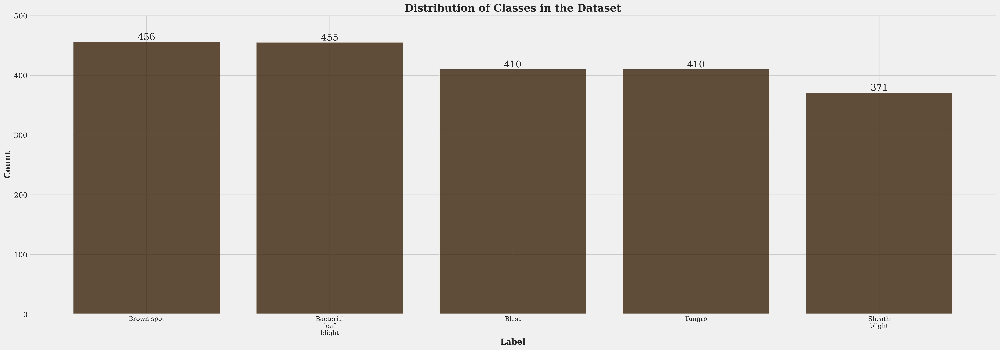

In [12]:
#8
from matplotlib import pyplot as plt
from cycler import cycler
import textwrap


plt.style.use('fivethirtyeight')

# Get the labels
label_counts = train_df['Label'].value_counts()[:]

# Create a cycler object using the desired colors
color_cycler = (cycler(color=["#3B240B"]))  # Darker coffee brown color

# Set the property cycle of the axes to the created cycler object
plt.rc('axes', prop_cycle=color_cycler)

# Other styling options
plt.rc("font", family="serif", size=18.)
plt.rc("savefig", dpi=200)
plt.rc("legend", loc="best", fontsize="medium", fancybox=True, framealpha=0.5)
plt.rc("lines", linewidth=2.5, markersize=10, markeredgewidth=2.5)

plt.figure(figsize=(30, 10), dpi=300)  # Increase figure size
bars = plt.bar(label_counts.index, label_counts.values, alpha=0.8)
plt.title('Distribution of Classes in the Dataset', fontsize=20, fontweight='bold')
plt.xlabel('Label', fontsize=16, fontweight='bold')
plt.ylabel('Count', fontsize=16, fontweight='bold')

# Wrap x-labels
wrapped_labels = ['\n'.join(textwrap.wrap(label, 10)) for label in label_counts.index]
plt.xticks(range(len(wrapped_labels)), wrapped_labels, fontsize=12, ha='center')  # Change alignment to 'center'

plt.yticks(fontsize=14)

# Adjust y limit to avoid overlapping
plt.ylim(0, max(label_counts) * 1.1)  # Set y limit 10% higher than the max value

# Add value annotations on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 0.05, int(yval), ha='center', va='bottom')

plt.show()

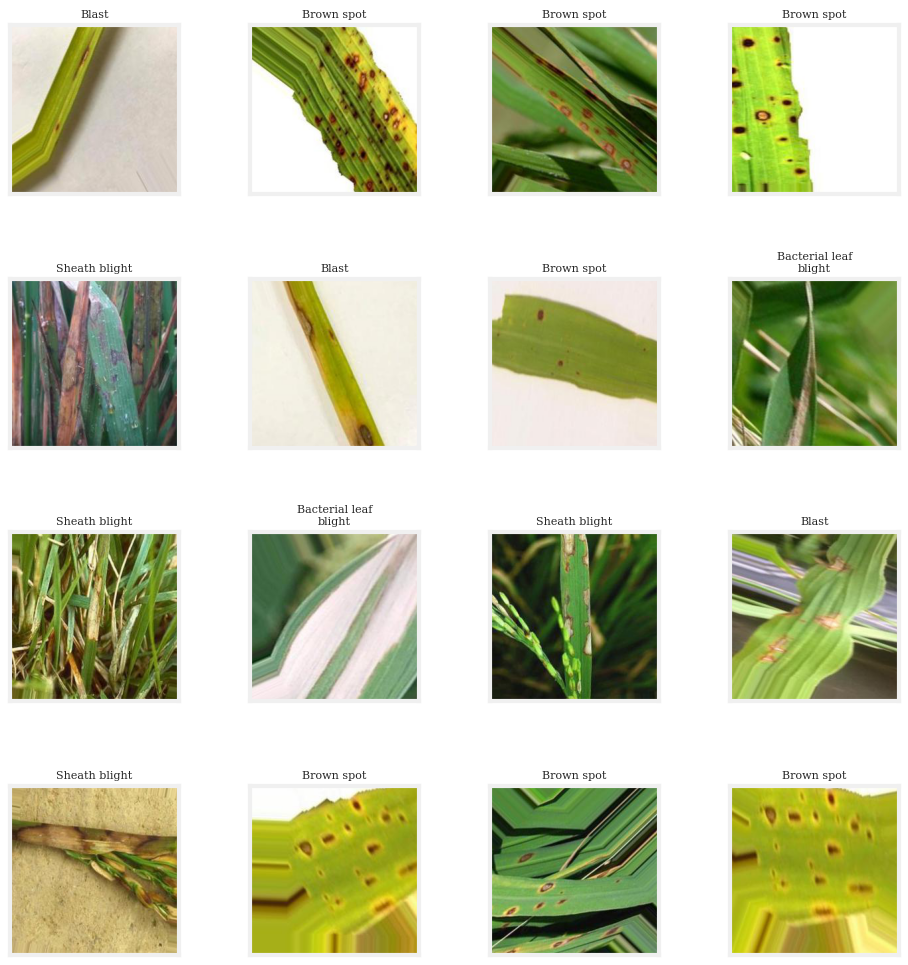

In [13]:
#9
import numpy as np

# Set title size and figure background color
plt.rcParams['axes.titlesize'] = 'small'  # Adjust as needed
plt.rcParams['figure.facecolor'] = 'white'  # Set figure background color to white

# Display 16 pictures of the dataset with their labels
random_index = np.random.randint(0, len(train_df), 16)
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(train_df.Filepath[random_index[i]]))
    title = train_df.Label[random_index[i]]
    ax.set_title("\n".join(textwrap.wrap(title, 20)), fontsize=8)  # Wrap long titles
plt.tight_layout()
plt.subplots_adjust(hspace=0.5)  # Increase vertical space between subplots
plt.show()

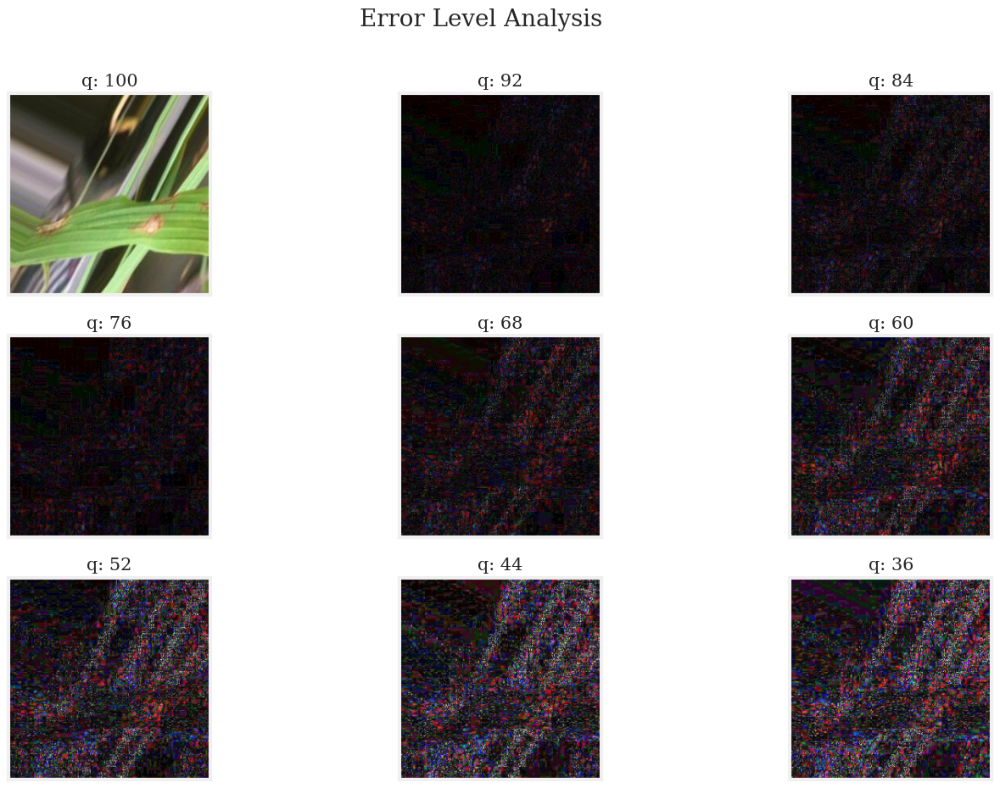

In [ ]:
#10
from random import choice

import random
from random import choice
import cv2
import numpy as np
from PIL import Image
from PIL import ImageChops
from pathlib import Path

def compute_ela_cv(path, quality):
    temp_filename = 'temp_file_name.jpeg'
    SCALE = 15

    try:
        orig_img = cv2.imread(path)
        if orig_img is None:
            raise ValueError("Failed to load original image")

        orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

        cv2.imwrite(temp_filename, orig_img, [cv2.IMWRITE_JPEG_QUALITY, quality])

        compressed_img = cv2.imread(temp_filename)
        if compressed_img is None:
            raise ValueError("Failed to load compressed image")

        diff = SCALE * cv2.absdiff(orig_img, compressed_img)
        return diff

    finally:
        # Clean up temporary file
        if Path(temp_filename).exists():
            Path(temp_filename).unlink()

def convert_to_ela_image(path, quality):
    temp_filename = 'temp_file_name.jpeg'
    ela_filename = 'temp_ela.png'

    try:
        image = Image.open(path).convert('RGB')
        image.save(temp_filename, 'JPEG', quality=quality)

        temp_image = Image.open(temp_filename)
        ela_image = ImageChops.difference(image, temp_image)

        extrema = ela_image.getextrema()
        max_diff = max([ex[1] for ex in extrema])
        if max_diff == 0:
            max_diff = 1

        scale = 255.0 / max_diff
        ela_image = ImageEnhance.Brightness(ela_image).enhance(scale)

        return ela_image

    finally:
        # Clean up temporary files
        if Path(temp_filename).exists():
            Path(temp_filename).unlink()
        if Path(ela_filename).exists():
            Path(ela_filename).unlink()

def random_sample(path, extension=None):
    if extension:
        items = Path(path).glob(f'*.{extension}')
    else:
        items = Path(path).glob(f'*')

    items = list(items)

    if len(items) > 0:
        p = choice(items)
        return p.as_posix()
    else:
        raise FileNotFoundError("No files found matching the given criteria")

# Usage
p = random_sample(r'C:\Users\effie\Documents\JupyterNotebook\archive3\Rice_Image_Dataset\Train\Blast')
orig = cv2.imread(p)
if orig is None:
    print("Failed to load image")
else:
    orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0
    init_val = 100
    columns = 3
    rows = 3

    fig=plt.figure(figsize=(15, 10))
    fig.suptitle('Error Level Analysis', fontsize=20)  # Add super title
    for i in range(1, columns*rows +1):
        quality=init_val - (i-1) * 8
        img = compute_ela_cv(path=p, quality=quality)
        if i == 1:
            img = orig.copy()
        ax = fig.add_subplot(rows, columns, i)
        ax.title.set_text(f'q: {quality}')
        plt.imshow(img)
        ax.set_xticks([])  # Remove x-ticks
        ax.set_yticks([])  # Remove y-ticks
    plt.show()


In [17]:
#11
'''
# Separate in train and test data
train_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet50.preprocess_input,
)

test_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet50.preprocess_input,
)


from sklearn.model_selection import train_test_split

# Shuffle your dataframe for randomness
train_df = train_df.sample(frac=1).reset_index(drop=True)

# Stratified Split
train_df, val_df = train_test_split(train_df, test_size=0.3, stratify=train_df['Label'])

# Now use train_df with train_images generator and val_df with val_images generator without the subset parameter
train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42
)

val_images = train_generator.flow_from_dataframe(
    dataframe=val_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False
)
'''

# Separate in train and test data
train_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet50.preprocess_input,
)

test_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet50.preprocess_input,
)

from sklearn.model_selection import train_test_split

# Shuffle your dataframe for randomness
train_df = train_df.sample(frac=1).reset_index(drop=True)

# Stratified Split
train_df, val_df = train_test_split(train_df, test_size=0.3, stratify=train_df['Label'])

# Now use train_df with train_images generator and val_df with val_images generator without the subset parameter
train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='sparse',  # Change to 'sparse' for integer labels
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42
)

val_images = train_generator.flow_from_dataframe(
    dataframe=val_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='sparse',  # Change to 'sparse' for integer labels
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='sparse',  # Change to 'sparse' for integer labels
    batch_size=BATCH_SIZE,
    shuffle=False
)

Found 1029 validated image filenames belonging to 5 classes.
Found 442 validated image filenames belonging to 5 classes.
Found 850 validated image filenames belonging to 5 classes.


In [18]:
#12
train_df['Label'].value_counts()
train_df['Filepath'].apply(type)

877     <class 'str'>
574     <class 'str'>
1214    <class 'str'>
1123    <class 'str'>
773     <class 'str'>
            ...      
1448    <class 'str'>
1453    <class 'str'>
1315    <class 'str'>
1041    <class 'str'>
1445    <class 'str'>
Name: Filepath, Length: 1029, dtype: object

In [19]:
#13
# Function to get distribution from the generator
def get_distribution(generator):
    # Counting occurrences for each class
    counter = Counter(generator.classes)
    max_val = float(max(counter.values()))
    return {k: v/max_val for k, v in counter.items()}

# Print distributions
print(get_distribution(train_images))
print(get_distribution(val_images))


{3: 0.8161434977578476, 0: 0.9955156950672646, 4: 0.9013452914798207, 2: 1.0, 1: 0.9013452914798207}
{2: 1.0, 4: 0.8958333333333334, 3: 0.8125, 1: 0.8958333333333334, 0: 1.0}


In [21]:
#14
# Data Augmentation Step
import tensorflow as tf
from tensorflow.keras.layers import Resizing, Rescaling, RandomFlip, RandomRotation, RandomContrast


augment = tf.keras.Sequential([
    tf.keras.layers.Resizing(224, 224),
    tf.keras.layers.Rescaling(1./255),
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.30),
    tf.keras.layers.RandomContrast(0.05),
    tf.keras.layers.RandomZoom(0.05),  # Add random zoom
    tf.keras.layers.RandomBrightness(0.05),  # Add random brightness
])


In [22]:
#15
# Load the pretained model
pretrained_model = tf.keras.applications.resnet50.ResNet50(
    input_shape=(224, 224, 3),
    include_top=False,
    #weights='imagenet',
    weights='imagenet',
    pooling='max'
)

pretrained_model.trainable = False



In [25]:
#16
# Create checkpoint callback
checkpoint_path = "mld_classification_model_checkpoint.weights.h5"
checkpoint_callback = ModelCheckpoint(checkpoint_path,
                                      save_weights_only=True,
                                      monitor="val_accuracy",
                                      save_best_only=True)

# Setup EarlyStopping callback to stop training if model's val_loss doesn't improve for 3 epochs
early_stopping = EarlyStopping(monitor = "val_loss", # watch the val loss metric
                               patience = 5,
                               restore_best_weights = True) # if val loss decreases for 3 epochs in a row, stop training

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)

In [ ]:
#17
'''
from keras import backend as K

def f1_score(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val
'''
from keras import backend as K

def f1_score(y_true, y_pred):
    # Convert y_pred to class indices
    y_pred_classes = K.argmax(y_pred, axis=-1)

    # Convert y_true to one-hot encoding
    y_true_one_hot = K.one_hot(K.cast(y_true, 'int32'), num_classes=K.shape(y_pred)[-1])

    # Calculate true positives, possible positives, and predicted positives
    true_positives = K.sum(K.round(K.clip(y_true_one_hot * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true_one_hot, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))

    # Calculate precision and recall
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())

    # Calculate F1 score
    f1_val = 2 * (precision * recall) / (precision + recall + K.epsilon())
    return f1_val

In [27]:
#18 Here!!! Modify your model to achieve higher accuracy
# Existing model structure
from tensorflow.keras import backend as K


inputs = pretrained_model.input
x = augment(inputs)
x = Dense(128, activation='relu')(pretrained_model.output)
x = Dropout(0.45)(x)
x = Dense(256, activation='relu')(x)
#x = Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
x = Dropout(0.45)(x)
#x = Dropout(0.5)(x)  # Increase dropout rate
outputs = Dense(5, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

'''
# Compile with custom F1-Score
model.compile(
    optimizer=Adam(0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy', f1_score]
)

history = model.fit(
    train_images,
    steps_per_epoch=len(train_images) // BATCH_SIZE,  # Adjusted steps_per_epoch
    validation_data=val_images,
    validation_steps=len(val_images) // BATCH_SIZE,  # Adjusted validation_steps
    epochs=10,
    callbacks=[
        early_stopping,
        create_tensorboard_callback("training_logs", "mld_classification"),
        checkpoint_callback,
        reduce_lr
    ]
)
'''

# Unfreeze some layers of the pre-trained model
for layer in pretrained_model.layers[-10:]:
    layer.trainable = True

# Compile the model with a different learning rate
model.compile(
    optimizer=Adam(0.001),  # Try a smaller learning rate
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy', f1_score]
)

# Train the model with more epochs and adjusted callbacks
history = model.fit(
    train_images,
    steps_per_epoch=len(train_images) // BATCH_SIZE,
    validation_data=val_images,
    validation_steps=len(val_images) // BATCH_SIZE,
    epochs=30,  # Increase the number of epochs
    callbacks=[
        early_stopping,
        create_tensorboard_callback("training_logs", "mld_classification"),
        checkpoint_callback,
        reduce_lr
    ]
)


Saving TensorBoard log files to: training_logs/mld_classification/20240925-153636
Epoch 1/30


C:\Users\effie\anaconda3\envs\crikee\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 55s 55s/step - accuracy: 0.1875 - f1_score: 0.2000 - loss: 8.1421 - val_accuracy: 0.2647 - val_f1_score: 0.2576 - val_loss: 3.4529 - learning_rate: 0.0010
Epoch 2/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 35s 35s/step - accuracy: 0.2188 - f1_score: 0.2258 - loss: 7.5466 - val_accuracy: 0.3032 - val_f1_score: 0.3128 - val_loss: 2.6926 - learning_rate: 0.0010
Epoch 3/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 38s 38s/step - accuracy: 0.1875 - f1_score: 0.1935 - loss: 7.8610 - val_accuracy: 0.5973 - val_f1_score: 0.5822 - val_loss: 1.2261 - learning_rate: 0.0010
Epoch 4/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 37s 37s/step - accuracy: 0.2188 - f1_score: 0.2258 - loss: 6.0722 - val_accuracy: 0.7014 - val_f1_score: 0.6846 - val_loss: 0.8707 - learning_rate: 0.0010
Epoch 5/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 38s 38s/step - accuracy: 0.4062 - f1_score: 0.4194 - loss: 3.2355 - val_accuracy: 0.7104 - val_f1_score: 0.6995 - val_loss: 0.8142 - learning_rate: 0.0010
Epoch 6/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 38s 38s/step - accur

In [28]:
#19
#model.save_weights('_leaf_disease_ResNet50.h5')
model.save_weights('_leaf_disease_ResNet50.weights.h5')

In [29]:
#20
results = model.evaluate(test_images, verbose=0)
print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))
print("  Test F1-score: {:.2f}%".format(results[2] * 100))

    Test Loss: 0.57594
Test Accuracy: 82.35%
  Test F1-score: 82.38%


In [30]:
#21
import os

file_size = os.path.getsize('_leaf_disease_ResNet50.weights.h5') / (1024 * 1024)  # Convert bytes to MB
print(f"Model file size: {file_size:.2f} MB")

Model file size: 119.89 MB


In [31]:
#22
total_params = model.count_params()
print(f"Total parameters: {total_params}")

Total parameters: 23884293


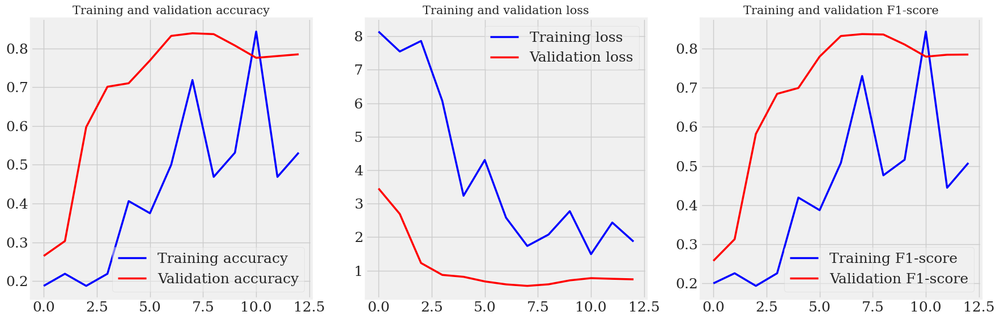

In [32]:
#23
# Extracting F1-score from the history object
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))
f1 = history.history['f1_score']
val_f1 = history.history['val_f1_score']

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))  # Create a 1x3 grid of plots

# Plot accuracy
ax1.plot(epochs, accuracy, 'b', label='Training accuracy')
ax1.plot(epochs, val_accuracy, 'r', label='Validation accuracy')
ax1.set_title('Training and validation accuracy')
ax1.legend()

# Plot loss
ax2.plot(epochs, loss, 'b', label='Training loss')
ax2.plot(epochs, val_loss, 'r', label='Validation loss')
ax2.set_title('Training and validation loss')
ax2.legend()

# Plot F1-score
ax3.plot(epochs, f1, 'b', label='Training F1-score')
ax3.plot(epochs, val_f1, 'r', label='Validation F1-score')
ax3.set_title('Training and validation F1-score')
ax3.legend()

plt.tight_layout()  # Adjust the padding between and around the subplots
plt.show()

In [33]:
#24
# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the labelz
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 5 predictions: {pred[:5]}')

27/27 ━━━━━━━━━━━━━━━━━━━━ 75s 3s/step
The first 5 predictions: ['Bacterial leaf blight', 'Bacterial leaf blight', 'Bacterial leaf blight', 'Tungro', 'Bacterial leaf blight']


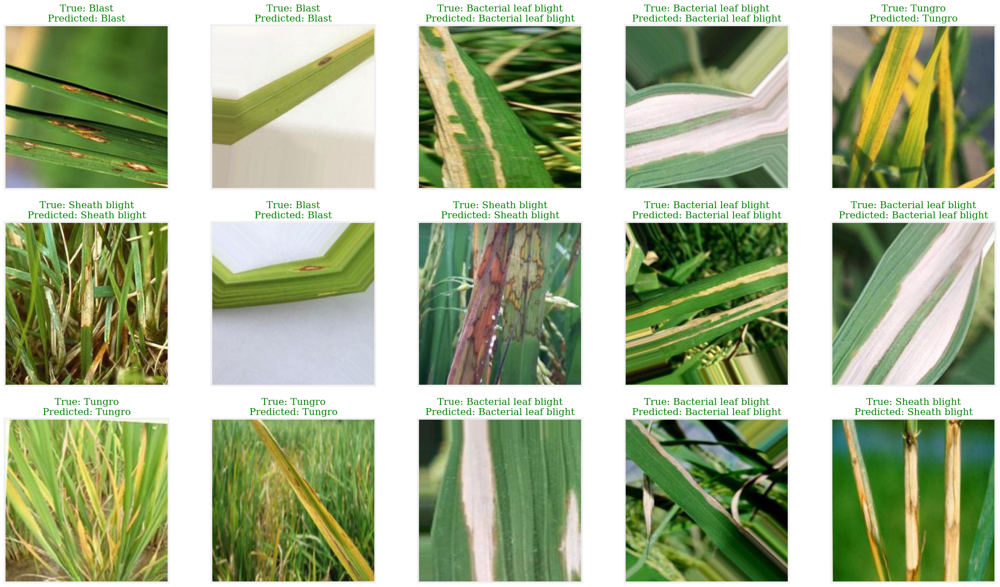

<Figure size 640x480 with 0 Axes>

In [34]:
#25
# Display 25 random pictures from the dataset with their labels
random_index = np.random.randint(0, len(test_df) - 1, 15)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[random_index[i]]))
    if test_df.Label.iloc[random_index[i]] == pred[random_index[i]]:
        color = "green"
    else:
        color = "red"
    ax.set_title(f"True: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}", color=color)
plt.show()
plt.tight_layout()

In [35]:
#26
import time

start_time = time.time()
model.predict(test_images)  # or any other input, just for demonstration
end_time = time.time()

print(f"Inference time: {end_time - start_time:.2f} seconds")

27/27 ━━━━━━━━━━━━━━━━━━━━ 67s 2s/step
Inference time: 67.77 seconds


Class Bacterial leaf blight:
Precision: [0.22117647 0.7839196  1.        ]
Recall: [1.         0.82978723 0.        ]
Average Precision: 0.69

Class Blast:
Precision: [0.19176471 0.86915888 1.        ]
Recall: [1.         0.57055215 0.        ]
Average Precision: 0.58

Class Brown spot:
Precision: [0.22       0.84422111 1.        ]
Recall: [1.         0.89839572 0.        ]
Average Precision: 0.78

Class Sheath blight:
Precision: [0.17529412 0.82941176 1.        ]
Recall: [1.         0.94630872 0.        ]
Average Precision: 0.79

Class Tungro:
Precision: [0.19176471 0.81142857 1.        ]
Recall: [1.         0.87116564 0.        ]
Average Precision: 0.73



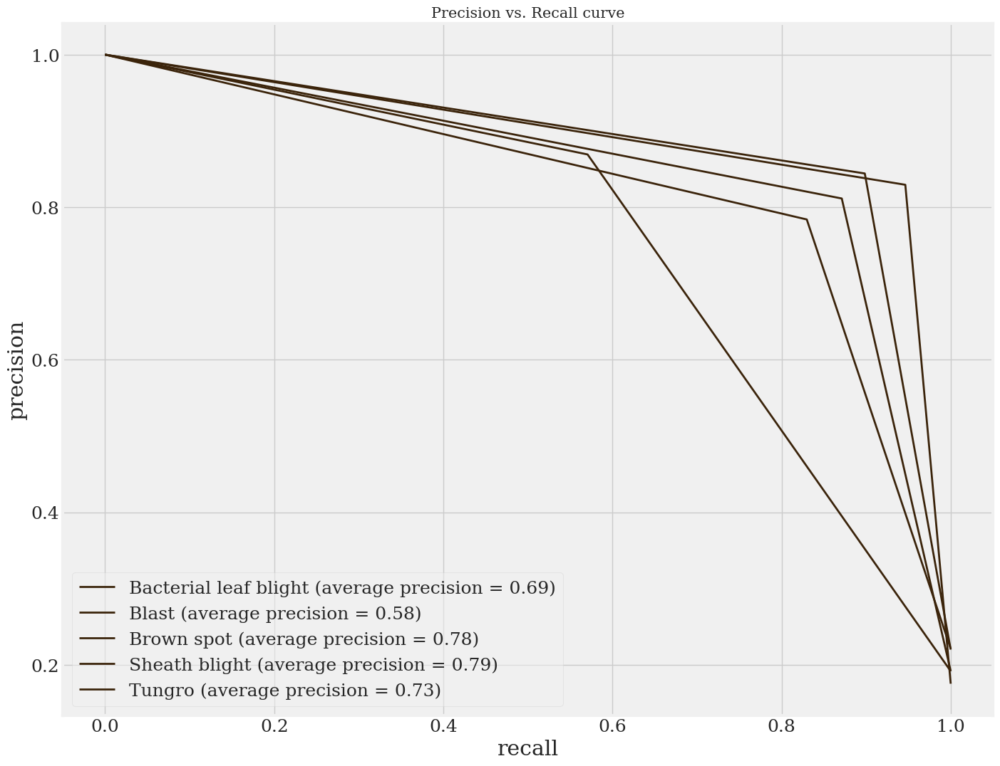

In [ ]:
#27
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.preprocessing import LabelBinarizer
import matplotlib.pyplot as plt

# Convert labels to one-hot encoding
lb = LabelBinarizer()
y_true_onehot = lb.fit_transform(test_df.Label)

# Convert predictions to one-hot encoding
y_pred_onehot = lb.transform(pred)

# For storing average precision for each class
average_precision = {}

# Get class names
class_names = lb.classes_

# Plot PR curve for each class
n_classes = y_true_onehot.shape[1]
plt.figure(figsize=(15, 12))

for i in range(n_classes):
    precision, recall, _ = precision_recall_curve(y_true_onehot[:, i], y_pred_onehot[:, i])
    average_precision[i] = average_precision_score(y_true_onehot[:, i], y_pred_onehot[:, i])

    # Printing the precision and recall values for each class using the actual class names
    print(f"Class {class_names[i]}:")
    print("Precision:", precision)
    print("Recall:", recall)
    print(f"Average Precision: {average_precision[i]:.2f}\n")

    plt.plot(recall, precision, lw=2, label=f'{class_names[i]} (average precision = {average_precision[i]:0.2f})')

plt.xlabel("recall")
plt.ylabel("precision")
plt.legend(loc="best")
plt.title("Precision vs. Recall curve")
plt.grid(True)
plt.show()

In [38]:
#28
y_test = list(test_df.Label)
report = classification_report(y_test, pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df

,precision,recall,f1-score,support
Bacterial leaf blight,0.783920,0.829787,0.806202,188.000000
Blast,0.869159,0.570552,0.688889,163.000000
Brown spot,0.844221,0.898396,0.870466,187.000000
Sheath blight,0.829412,0.946309,0.884013,149.000000
Tungro,0.811429,0.871166,0.840237,163.000000
accuracy,0.823529,0.823529,0.823529,0.823529
macro avg,0.827628,0.823242,0.817961,850.000000
weighted avg,0.826782,0.823529,0.818010,850.000000


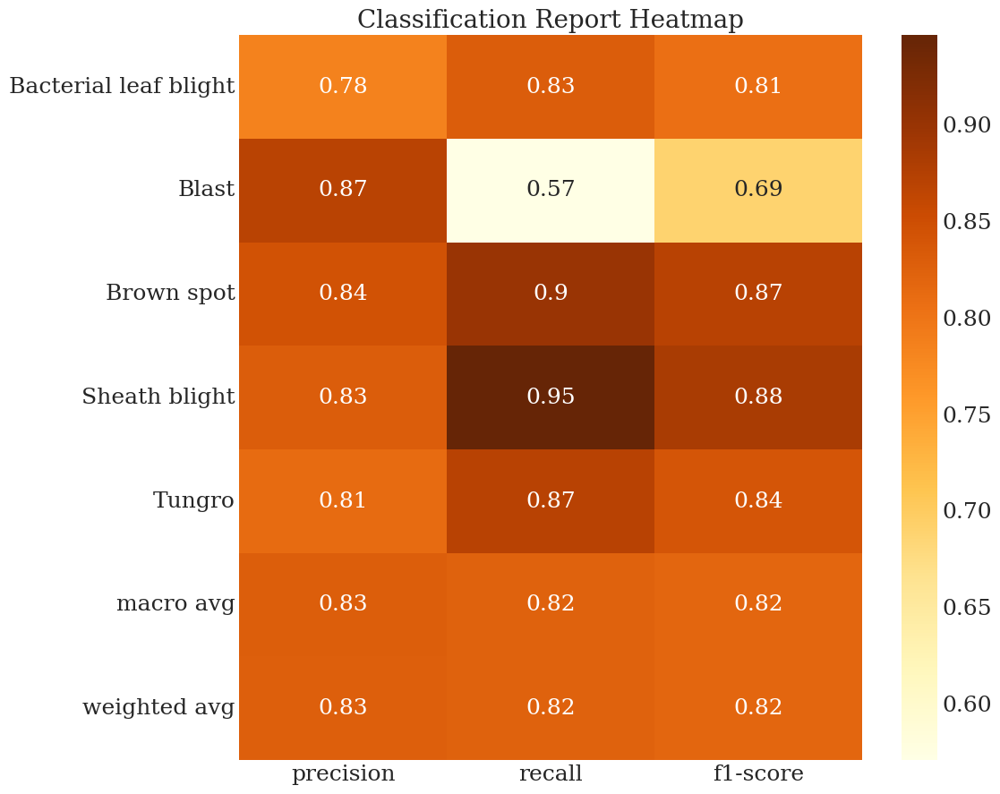

In [39]:
#29
# Remove the 'accuracy' row
df = df.drop(['accuracy'])

# Remove the 'support' column
df = df.drop(['support'], axis=1)

plt.figure(figsize=(10, 10))
sns.heatmap(df, annot=True, cmap='YlOrBr')
plt.title('Classification Report Heatmap', fontsize=20)
plt.show()

In [ ]:
#30
def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(20, 14), text_size=10, norm=False, savefig=False):
    """Makes a labelled confusion matrix comparing predictions and ground truth labels.

    If classes is passed, confusion matrix will be labelled, if not, integer class values
  will be used.

  Args:
    y_true: Array of truth labels (must be same shape as y_pred).
    y_pred: Array of predicted labels (must be same shape as y_true).
    classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
    figsize: Size of output figure (default=(10, 10)).
    text_size: Size of output figure text (default=15).
    norm: normalize values or not (default=False).
    savefig: save confusion matrix to file (default=False).

  Returns:
    A labelled confusion matrix plot comparing y_true and y_pred.

  Example usage:
    make_confusion_matrix(y_true=test_labels, # ground truth test labels
                          y_pred=y_preds, # predicted labels
                          classes=class_names, # array of class label names
                          figsize=(15, 15),
                          text_size=10)
    """
  # Create the confustion matrix

    # Use the fivethirtyeight style
    plt.style.use('fivethirtyeight')
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
    n_classes = cm.shape[0] # find the number of classes we're dealing with

    # Plot the figure and make it pretty
    fig, ax = plt.subplots(figsize=figsize)
    cax = ax.matshow(cm, cmap=plt.cm.YlOrBr) # colors will represent how 'correct' a class is, darker == better
    fig.colorbar(cax)

    # Are there a list of classes?
    if classes:
        labels = classes
    else:
        labels = np.arange(cm.shape[0])

    # Label the axes
    ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes),
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)

    # Make x-axis labels appear on bottom
    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()
    ### Added: Rotate xticks for readability & increase font size (required due to such a large confusion matrix)
    plt.xticks(rotation=90, fontsize=text_size)
    plt.yticks(fontsize=text_size)

    # Set the threshold for different colors
    threshold = (cm.max() + cm.min()) / 2.

    # Plot the text on each cell
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if norm:
            plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size)
        else:
            plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

  # Save the figure to the current working directory
    if savefig:
        fig.savefig("confusion_matrix.png")

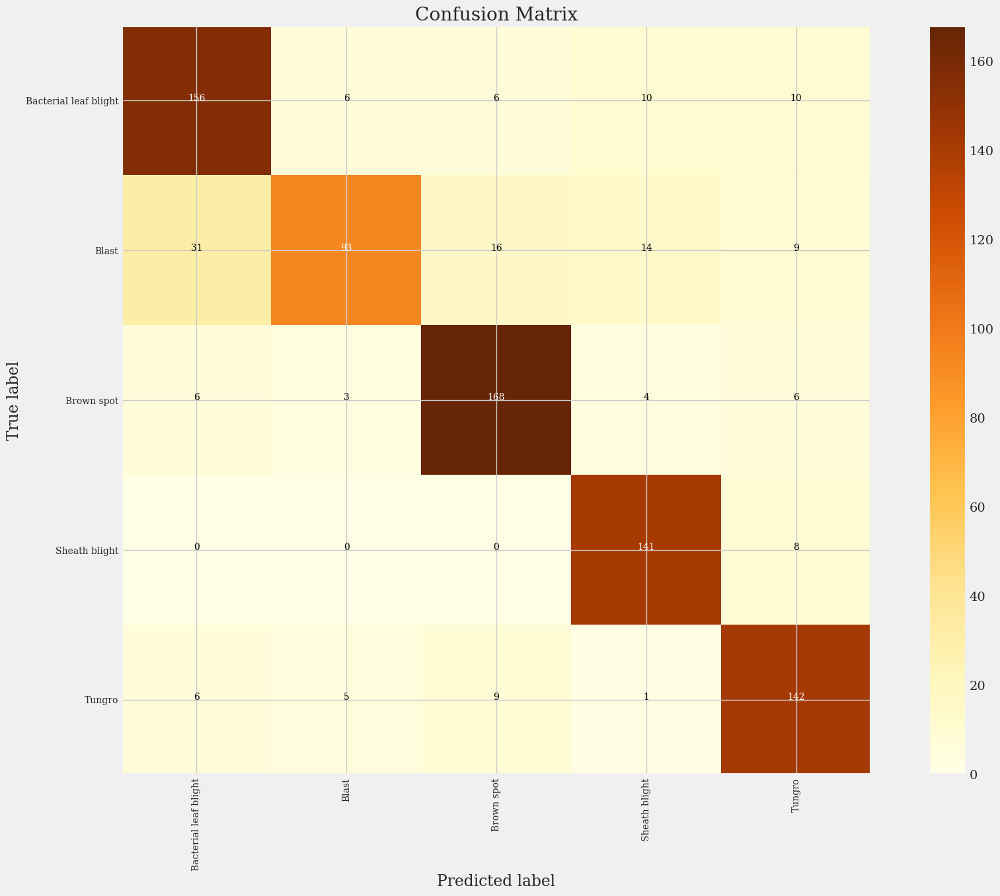

In [41]:
#31
make_confusion_matrix(y_test, pred, list(labels.values()))

In [ ]:
#32
def get_img_array(img_path, size):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    array = tf.keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size "size"
    array = np.expand_dims(array, axis=0)
    return array

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]
    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = tf.keras.preprocessing.image.load_img(img_path)
    img = tf.keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)
    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
#     display(Image(cam_path))

    return cam_path

preprocess_input = tf.keras.applications.efficientnet.preprocess_input
decode_predictions = tf.keras.applications.efficientnet.decode_predictions

last_conv_layer_name = "conv5_block3_out"

img_size = (224,224, 3)

# Remove last layer's softmax
model.layers[-1].activation = None

C:\Users\effie\AppData\Local\Temp\ipykernel_19068\137408499.py:51: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = cm.get_cmap("jet")


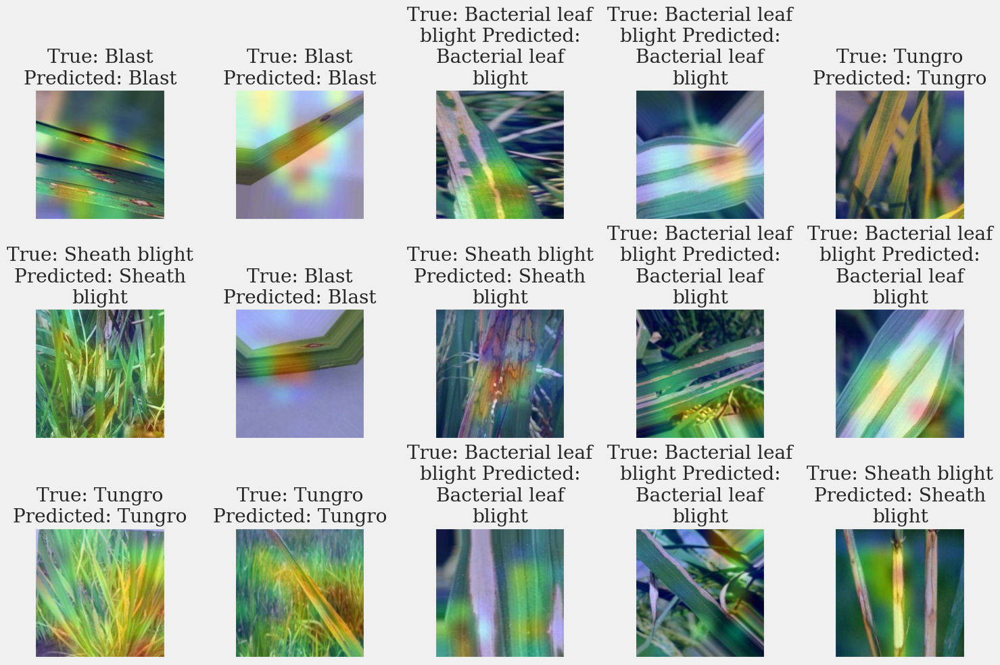

In [ ]:
#33
import textwrap

# Display the part of the pictures used by the neural network to classify the pictures
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    img_path = test_df.Filepath.iloc[random_index[i]]
    img_array = preprocess_input(get_img_array(img_path, size=img_size))
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
    cam_path = save_and_display_gradcam(img_path, heatmap)
    ax.imshow(plt.imread(cam_path))

    # Wrap the title text
    title_text = f"True: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}"
    wrapped_title = '\n'.join(textwrap.wrap(title_text, 20))  # Adjust the number as needed
    ax.set_title(wrapped_title)

plt.tight_layout()
plt.show()

In [44]:
#34
# Load the pretained model
pretrained_model = tf.keras.applications.efficientnet.EfficientNetB0(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='max'
)

pretrained_model.trainable = False

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 17s 1us/step


In [46]:
#35
# Create checkpoint callback
checkpoint_path = "ef_classification_model_checkpoint.weights.h5"
checkpoint_callback = ModelCheckpoint(checkpoint_path,
                                      save_weights_only=True,
                                      monitor="val_accuracy",
                                      save_best_only=True)

# Setup EarlyStopping callback to stop training if model's val_loss doesn't improve for 3 epochs
early_stopping = EarlyStopping(monitor = "val_loss", # watch the val loss metric
                               patience = 5,
                               restore_best_weights = True) # if val loss decreases for 3 epochs in a row, stop training

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)

In [ ]:
#36

'''
from keras import backend as K

def f1_score(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val
'''
from keras import backend as K

def f1_score(y_true, y_pred):
    # Convert y_pred to class indices
    y_pred_classes = K.argmax(y_pred, axis=-1)

    # Convert y_true to one-hot encoding
    y_true_one_hot = K.one_hot(K.cast(y_true, 'int32'), num_classes=K.shape(y_pred)[-1])

    # Calculate true positives, possible positives, and predicted positives
    true_positives = K.sum(K.round(K.clip(y_true_one_hot * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true_one_hot, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))

    # Calculate precision and recall
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())

    # Calculate F1 score
    f1_val = 2 * (precision * recall) / (precision + recall + K.epsilon())
    return f1_val

In [48]:
#37
#18 Here!!! Modify your model to achieve higher accuracy
# Existing model structure
from tensorflow.keras import backend as K


inputs = pretrained_model.input
x = augment(inputs)
x = Dense(128, activation='relu')(pretrained_model.output)
x = Dropout(0.45)(x)
x = Dense(256, activation='relu')(x)
#x = Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
x = Dropout(0.45)(x)
#x = Dropout(0.5)(x)  # Increase dropout rate
outputs = Dense(5, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

'''
# Compile with custom F1-Score
model.compile(
    optimizer=Adam(0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy', f1_score]
)

history = model.fit(
    train_images,
    steps_per_epoch=len(train_images) // BATCH_SIZE,  # Adjusted steps_per_epoch
    validation_data=val_images,
    validation_steps=len(val_images) // BATCH_SIZE,  # Adjusted validation_steps
    epochs=10,
    callbacks=[
        early_stopping,
        create_tensorboard_callback("training_logs", "mld_classification"),
        checkpoint_callback,
        reduce_lr
    ]
)
'''

# Unfreeze some layers of the pre-trained model
for layer in pretrained_model.layers[-10:]:
    layer.trainable = True

# Compile the model with a different learning rate
model.compile(
    optimizer=Adam(0.001),  # Try a smaller learning rate
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy', f1_score]
)

# Train the model with more epochs and adjusted callbacks
history = model.fit(
    train_images,
    steps_per_epoch=len(train_images) // BATCH_SIZE,
    validation_data=val_images,
    validation_steps=len(val_images) // BATCH_SIZE,
    epochs=30,  # Increase the number of epochs
    callbacks=[
        early_stopping,
        create_tensorboard_callback("training_logs", "ef_classification"),
        checkpoint_callback,
        reduce_lr
    ]
)


Saving TensorBoard log files to: training_logs/ef_classification/20240925-161620
Epoch 1/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 45s 45s/step - accuracy: 0.2188 - f1_score: 0.2295 - loss: 4.9876 - val_accuracy: 0.2715 - val_f1_score: 0.2581 - val_loss: 1.8451 - learning_rate: 0.0010
Epoch 2/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 23s 23s/step - accuracy: 0.1562 - f1_score: 0.1333 - loss: 4.6054 - val_accuracy: 0.4208 - val_f1_score: 0.4168 - val_loss: 1.4168 - learning_rate: 0.0010
Epoch 3/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 23s 23s/step - accuracy: 0.2812 - f1_score: 0.2623 - loss: 3.0553 - val_accuracy: 0.4683 - val_f1_score: 0.4715 - val_loss: 1.2497 - learning_rate: 0.0010
Epoch 4/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 23s 23s/step - accuracy: 0.1562 - f1_score: 0.1754 - loss: 3.9080 - val_accuracy: 0.5611 - val_f1_score: 0.5296 - val_loss: 1.0182 - learning_rate: 0.0010
Epoch 5/30
1/1 ━━━━━━━━━━━━━━━━━━━━ 22s 22s/step - accuracy: 0.2188 - f1_score: 0.2373 - loss: 2.8295 - val_accuracy: 0.6561 - val_f1_score: 0.5900 - val_l

In [49]:
#38
#model.save_weights('_leaf_disease_EfficientNetB0.h5')
model.save_weights('_leaf_disease_EfficientNetB0.weights.h5')

In [50]:
#39
results = model.evaluate(test_images, verbose=0)
print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))
print("  Test F1-score: {:.2f}%".format(results[2] * 100))


    Test Loss: 0.42643
Test Accuracy: 88.35%
  Test F1-score: 85.84%


In [51]:
#40
import os

file_size = os.path.getsize('_leaf_disease_EfficientNetB0.weights.h5') / (1024 * 1024)  # Convert bytes to MB
print(f"Model file size: {file_size:.2f} MB")

Model file size: 25.10 MB


In [52]:
#41
total_params = model.count_params()
print(f"Total parameters: {total_params}")

Total parameters: 4247848


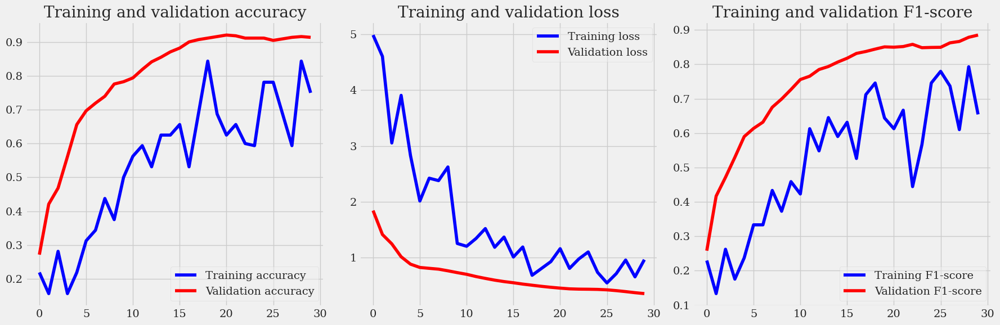

In [53]:
#42

# Extracting F1-score from the history object
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))
f1 = history.history['f1_score']
val_f1 = history.history['val_f1_score']

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))  # Create a 1x3 grid of plots

# Plot accuracy
ax1.plot(epochs, accuracy, 'b', label='Training accuracy')
ax1.plot(epochs, val_accuracy, 'r', label='Validation accuracy')
ax1.set_title('Training and validation accuracy')
ax1.legend()

# Plot loss
ax2.plot(epochs, loss, 'b', label='Training loss')
ax2.plot(epochs, val_loss, 'r', label='Validation loss')
ax2.set_title('Training and validation loss')
ax2.legend()

# Plot F1-score
ax3.plot(epochs, f1, 'b', label='Training F1-score')
ax3.plot(epochs, val_f1, 'r', label='Validation F1-score')
ax3.set_title('Training and validation F1-score')
ax3.legend()

plt.tight_layout()  # Adjust the padding between and around the subplots
plt.show()

In [54]:
#43

# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the labelz
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 5 predictions: {pred[:5]}')

27/27 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step
The first 5 predictions: ['Bacterial leaf blight', 'Bacterial leaf blight', 'Sheath blight', 'Bacterial leaf blight', 'Bacterial leaf blight']


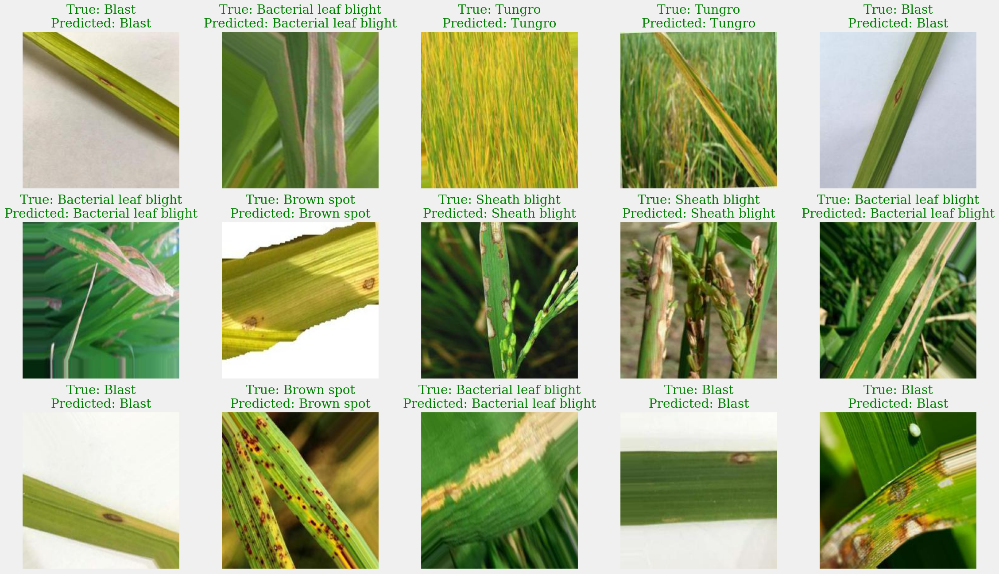

<Figure size 640x480 with 0 Axes>

In [57]:
#44

# Display 25 random pictures from the dataset with their labels
random_index = np.random.randint(0, len(test_df) - 1, 15)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[random_index[i]]))
    if test_df.Label.iloc[random_index[i]] == pred[random_index[i]]:
        color = "green"
    else:
        color = "red"
    ax.set_title(f"True: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}", color=color)
plt.show()
plt.tight_layout()

In [58]:
#45
import time

start_time = time.time()
model.predict(test_images)  # or any other input, just for demonstration
end_time = time.time()

print(f"Inference time: {end_time - start_time:.2f} seconds")


27/27 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step
Inference time: 41.02 seconds


Class Bacterial leaf blight:
Precision: [0.22117647 0.91176471 1.        ]
Recall: [1.         0.82446809 0.        ]
Average Precision: 0.79

Class Blast:
Precision: [0.19176471 0.9047619  1.        ]
Recall: [1.         0.81595092 0.        ]
Average Precision: 0.77

Class Brown spot:
Precision: [0.22       0.94505495 1.        ]
Recall: [1.        0.9197861 0.       ]
Average Precision: 0.89

Class Sheath blight:
Precision: [0.17529412 0.83116883 1.        ]
Recall: [1.        0.8590604 0.       ]
Average Precision: 0.74

Class Tungro:
Precision: [0.19176471 0.82741117 1.        ]
Recall: [1. 1. 0.]
Average Precision: 0.83



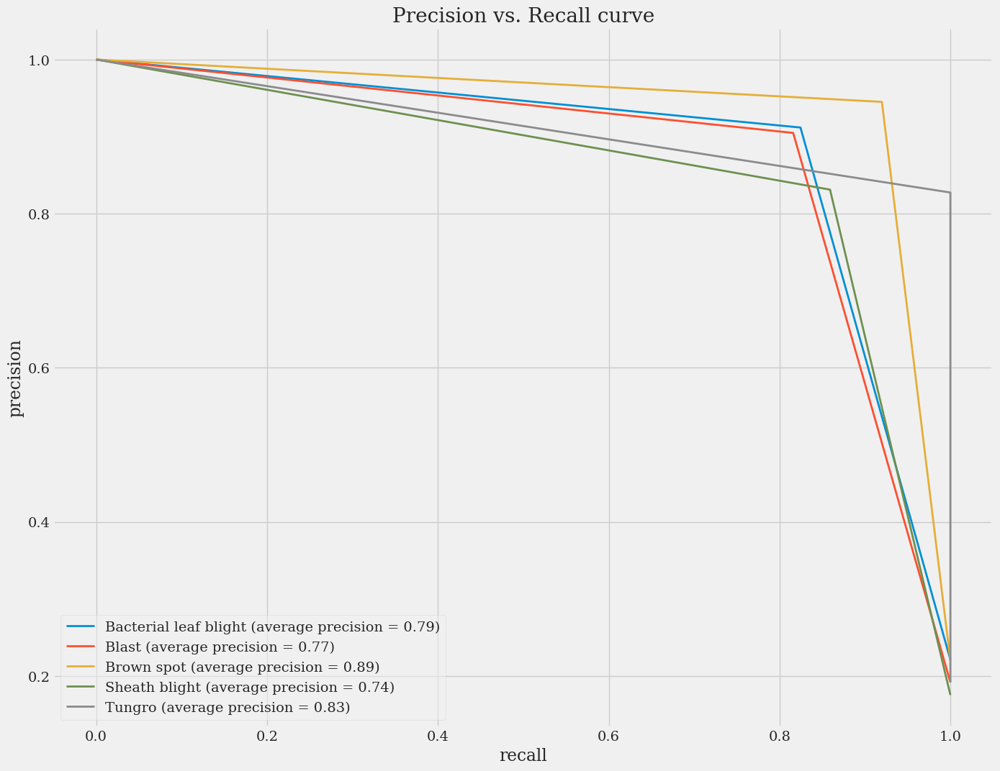

In [ ]:
#46

from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.preprocessing import LabelBinarizer
import matplotlib.pyplot as plt

# Convert labels to one-hot encoding
lb = LabelBinarizer()
y_true_onehot = lb.fit_transform(test_df.Label)

# Convert predictions to one-hot encoding
y_pred_onehot = lb.transform(pred)

# For storing average precision for each class
average_precision = {}

# Get class names
class_names = lb.classes_

# Plot PR curve for each class
n_classes = y_true_onehot.shape[1]
plt.figure(figsize=(15, 12))

for i in range(n_classes):
    precision, recall, _ = precision_recall_curve(y_true_onehot[:, i], y_pred_onehot[:, i])
    average_precision[i] = average_precision_score(y_true_onehot[:, i], y_pred_onehot[:, i])

    # Printing the precision and recall values for each class using the actual class names
    print(f"Class {class_names[i]}:")
    print("Precision:", precision)
    print("Recall:", recall)
    print(f"Average Precision: {average_precision[i]:.2f}\n")

    plt.plot(recall, precision, lw=2, label=f'{class_names[i]} (average precision = {average_precision[i]:0.2f})')

plt.xlabel("recall")
plt.ylabel("precision")
plt.legend(loc="best")
plt.title("Precision vs. Recall curve")
plt.grid(True)
plt.show()

In [60]:
#47

y_test = list(test_df.Label)
report = classification_report(y_test, pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df

,precision,recall,f1-score,support
Bacterial leaf blight,0.911765,0.824468,0.865922,188.000000
Blast,0.904762,0.815951,0.858065,163.000000
Brown spot,0.945055,0.919786,0.932249,187.000000
Sheath blight,0.831169,0.859060,0.844884,149.000000
Tungro,0.827411,1.000000,0.905556,163.000000
accuracy,0.883529,0.883529,0.883529,0.883529
macro avg,0.884032,0.883853,0.881335,850.000000
weighted avg,0.887442,0.883529,0.882920,850.000000


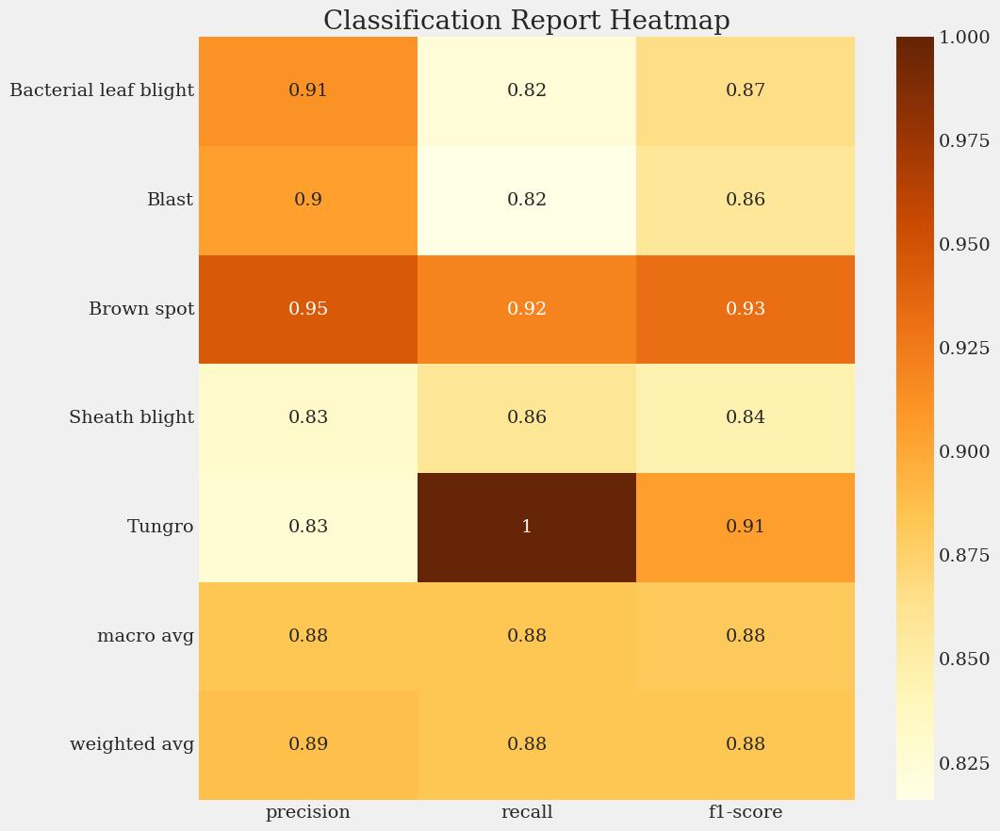

In [61]:
#48

# Remove the 'accuracy' row
df = df.drop(['accuracy'])

# Remove the 'support' column
df = df.drop(['support'], axis=1)

plt.figure(figsize=(10, 10))
sns.heatmap(df, annot=True, cmap='YlOrBr')
plt.title('Classification Report Heatmap', fontsize=20)
plt.show()

In [ ]:
#49

def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(20, 14), text_size=10, norm=False, savefig=False):
    """Makes a labelled confusion matrix comparing predictions and ground truth labels.

    If classes is passed, confusion matrix will be labelled, if not, integer class values
  will be used.

  Args:
    y_true: Array of truth labels (must be same shape as y_pred).
    y_pred: Array of predicted labels (must be same shape as y_true).
    classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
    figsize: Size of output figure (default=(10, 10)).
    text_size: Size of output figure text (default=15).
    norm: normalize values or not (default=False).
    savefig: save confusion matrix to file (default=False).

  Returns:
    A labelled confusion matrix plot comparing y_true and y_pred.

  Example usage:
    make_confusion_matrix(y_true=test_labels, # ground truth test labels
                          y_pred=y_preds, # predicted labels
                          classes=class_names, # array of class label names
                          figsize=(15, 15),
                          text_size=10)
    """
  # Create the confustion matrix

    # Use the fivethirtyeight style
    plt.style.use('fivethirtyeight')
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
    n_classes = cm.shape[0] # find the number of classes we're dealing with

    # Plot the figure and make it pretty
    fig, ax = plt.subplots(figsize=figsize)
    cax = ax.matshow(cm, cmap=plt.cm.YlOrBr) # colors will represent how 'correct' a class is, darker == better
    fig.colorbar(cax)

    # Are there a list of classes?
    if classes:
        labels = classes
    else:
        labels = np.arange(cm.shape[0])

    # Label the axes
    ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes),
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)

    # Make x-axis labels appear on bottom
    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()
    ### Added: Rotate xticks for readability & increase font size (required due to such a large confusion matrix)
    plt.xticks(rotation=90, fontsize=text_size)
    plt.yticks(fontsize=text_size)

    # Set the threshold for different colors
    threshold = (cm.max() + cm.min()) / 2.

    # Plot the text on each cell
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if norm:
            plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size)
        else:
            plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

  # Save the figure to the current working directory
    if savefig:
        fig.savefig("confusion_matrix.png")

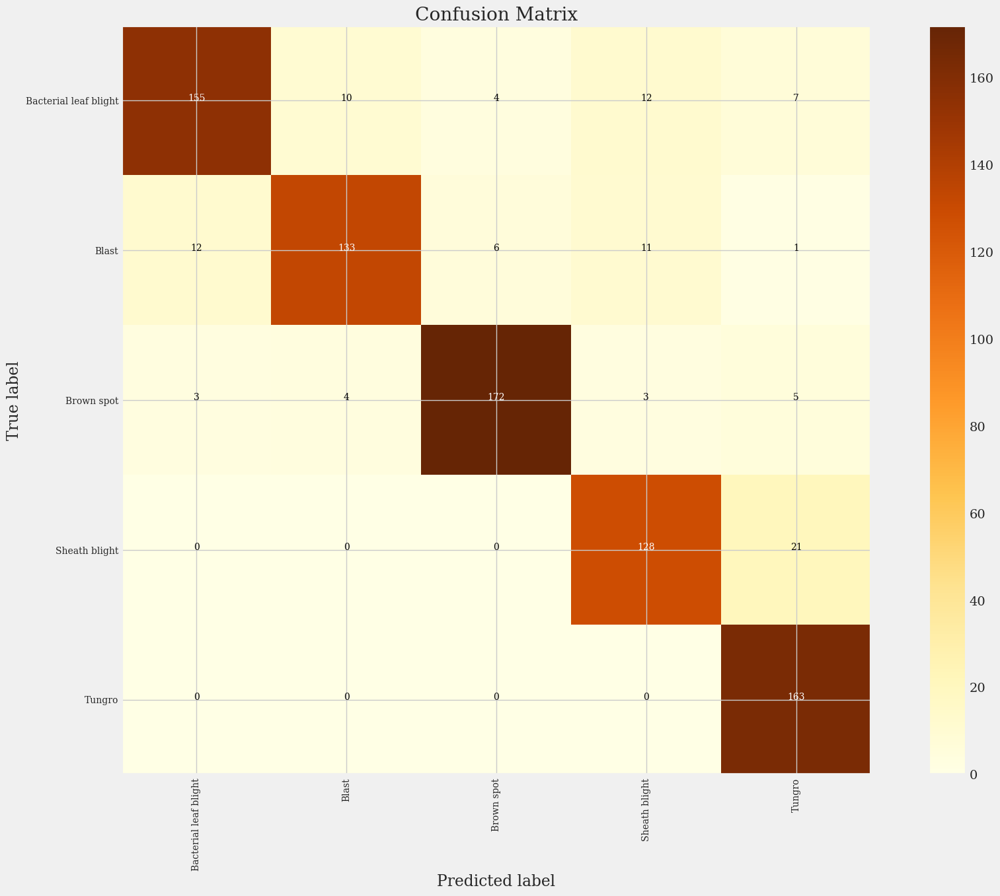

In [64]:
#50

make_confusion_matrix(y_test, pred, list(labels.values()))

In [68]:
# Print all layer names to find the correct last convolutional layer
for layer in model.layers:
    print(layer.name)

input_layer_2
rescaling_2
normalization
rescaling_3
stem_conv_pad
stem_conv
stem_bn
stem_activation
block1a_dwconv
block1a_bn
block1a_activation
block1a_se_squeeze
block1a_se_reshape
block1a_se_reduce
block1a_se_expand
block1a_se_excite
block1a_project_conv
block1a_project_bn
block2a_expand_conv
block2a_expand_bn
block2a_expand_activation
block2a_dwconv_pad
block2a_dwconv
block2a_bn
block2a_activation
block2a_se_squeeze
block2a_se_reshape
block2a_se_reduce
block2a_se_expand
block2a_se_excite
block2a_project_conv
block2a_project_bn
block2b_expand_conv
block2b_expand_bn
block2b_expand_activation
block2b_dwconv
block2b_bn
block2b_activation
block2b_se_squeeze
block2b_se_reshape
block2b_se_reduce
block2b_se_expand
block2b_se_excite
block2b_project_conv
block2b_project_bn
block2b_drop
block2b_add
block3a_expand_conv
block3a_expand_bn
block3a_expand_activation
block3a_dwconv_pad
block3a_dwconv
block3a_bn
block3a_activation
block3a_se_squeeze
block3a_se_reshape
block3a_se_reduce
block3a_se_ex

In [ ]:
#51

def get_img_array(img_path, size):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    array = tf.keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size "size"
    array = np.expand_dims(array, axis=0)
    return array

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]
    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = tf.keras.preprocessing.image.load_img(img_path)
    img = tf.keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)
    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
#     display(Image(cam_path))

    return cam_path

preprocess_input = tf.keras.applications.efficientnet.preprocess_input
decode_predictions = tf.keras.applications.efficientnet.decode_predictions

last_conv_layer_name = "top_conv"

img_size = (224,224, 3)

# Remove last layer's softmax
model.layers[-1].activation = None

C:\Users\effie\AppData\Local\Temp\ipykernel_19068\3398570542.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = cm.get_cmap("jet")


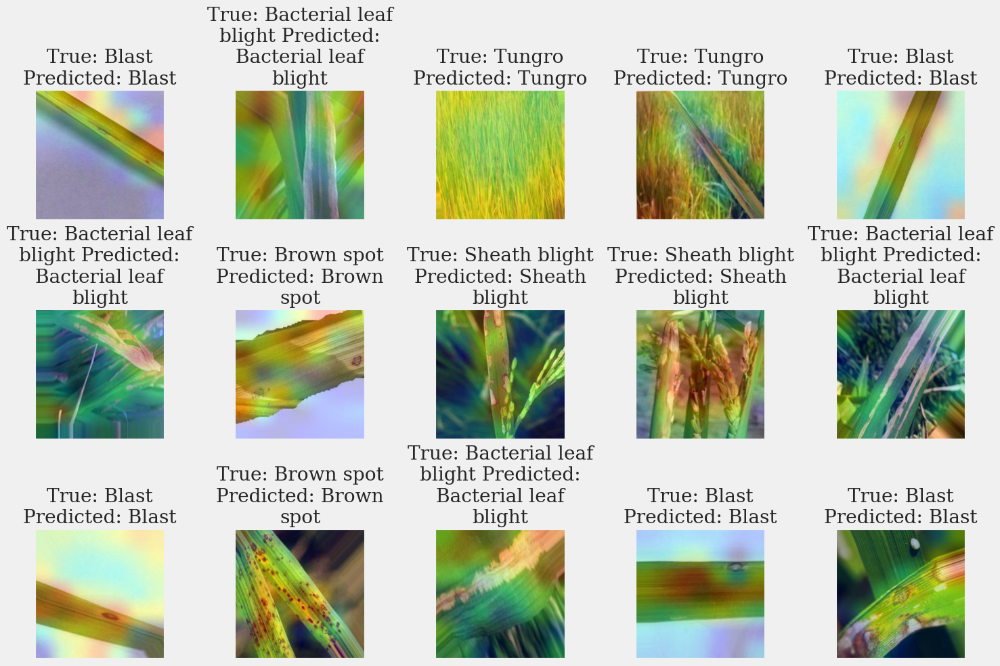

In [ ]:
#52
import textwrap

# Display the part of the pictures used by the neural network to classify the pictures
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    img_path = test_df.Filepath.iloc[random_index[i]]
    img_array = preprocess_input(get_img_array(img_path, size=img_size))
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
    cam_path = save_and_display_gradcam(img_path, heatmap)
    ax.imshow(plt.imread(cam_path))

    # Wrap the title text
    title_text = f"True: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}"
    wrapped_title = '\n'.join(textwrap.wrap(title_text, 20))  # Adjust the number as needed
    ax.set_title(wrapped_title)

plt.tight_layout()
plt.show()

In [1]:
print("hello")

hello


In [2]:
print("zzzz")

zzzz
